# SEA-AD CaH spatial transcriptomic coordinates and annotation

[INTRO TEXT HERE]

[SEA-AD CaH Taxonomy](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cach_clustering_analysis_and_annotation.html).

In this notebook, we walk through the data available in this release and show how they are joined together to enable analyses at the cell level.

You need to be connected to the internet to run this notebook and have run through the [getting started notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html).

In [1]:
from typing import List, Tuple, Optional

import pandas as pd
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache


We will interact with the data using the **AbcProjectCache**. This cache object tracks which data has been downloaded and serves the path to the requested data on disk. For metadata, the cache can also directly serve up a Pandas DataFrame. See the [``getting_started``](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing it if it has not already been.

**Change the download_base variable to where you would like to download the data in your system.**

In [2]:
download_base = Path('../../data/allen-brain-cell-atlas-staging')
abc_cache = AbcProjectCache.from_cache_dir(
    download_base,
    s3_bucket='allen-brain-cell-atlas-staging',
    auth_required=True
)

abc_cache.current_manifest

'releases/20260930/manifest.json'

## Data Overview

Below we list the available metadata and expression matrix files available for the SEA-AD CaH Xenium dataset.

In [3]:
dataset_name = 'SEA-AD-CaH-Xenium'
print(f"Dataset: {dataset_name}")
metadata_files = abc_cache.list_metadata_files(dataset_name)
print(f"Metadata files: {metadata_files}")
expression_matrix_files = abc_cache.list_expression_matrix_files(dataset_name)
print(f"Expression matrix files: {expression_matrix_files}\n")

Dataset: SEA-AD-CaH-Xenium
Metadata files: ['cell_metadata', 'disease', 'donor', 'example_gene_expression', 'gene', 'mmc_results', 'specimen_metadata', 'value_sets']
Expression matrix files: ['CaH-Xenium/log2', 'CaH-Xenium/raw']



### Cell metadata

Essential cell metadata is stored as a CSV file that we load as a Pandas DataFrame. Each row represents one cell indexed by a *cell label*. The *cell label* is the concatenation of the specimen barcode, the id from the Xenium platform, and a date. 

Each cell is associated with a *brain section label*, *donor label*, *feature_matrix_label* and *dataset_label* identifying which data package this cell is part of. This metadata file will be combined with other metadata files that come with this package to add information associated with the donor, coordinates, taxonomy assignments, and more.

Below, we load the first of the metadata used in this tutorial.

The command we use below both downloads the data if it is not already available in the local cache and loads the data as a Pandas DataFrame. This pattern of loading metadata is repeated throughout the tutorials.

In [6]:
cell_metadata = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='cell_metadata',
    dtype={"cell_label": str}
).set_index('cell_label')
cell_metadata.head()

,brain_section_label,brain_section_barcode,segmentation_method,Used in analysis,donor_label,x_experiment,y_experiment,feature_matrix_label,dataset_label
cell_label,,,,,,,,,
1417649873_aaabkjfl-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2873.683077,19562.403493,CaH-Xenium,SEA-AD-CaH-Xenium
1417649873_aaadgmad-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,3404.344554,18042.061121,CaH-Xenium,SEA-AD-CaH-Xenium
1417649873_aaalcohl-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,3807.791820,19874.499081,CaH-Xenium,SEA-AD-CaH-Xenium
1417649873_aaalgkhn-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2939.943417,20208.759191,CaH-Xenium,SEA-AD-CaH-Xenium
1417649873_aabcbjaf-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2903.243911,19543.173254,CaH-Xenium,SEA-AD-CaH-Xenium


### Donor, Specimen, and disease metadata

The first two associated metadata we load are the `donor`, `specimen_metadta`, and `disease` tables. The donor table includes donor demographics such as species, age, sex, race, and education, along with brain tissue metrics. This table also indicates which study a donor was enrolled in (ACT or ADRC). The specimen table contains information on brain sections/specimen that data originate from as well as the brain section order. The disease table contains disease progression metrics and other pathology data. Definitions of many of these columns can be found [here](https://cdn.prod.website-files.com/689cfbd308fa7373b604d290/6a458356cbaf777f617ae687_sea-ad_donorindex_dataelementbriefdescriptions_063026.pdf).

In [7]:
donor = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='donor',
).set_index('donor_label')
donor.head()

,donor_species,species_scientific_name,species_genus,donor_age,donor_age_value,age_at_death_reference_point,donor_age_unit,donor_sex,donor_gender,donor_race,...,Race (choice=Unknown or unreported),Race (choice=Other),specify other race,Hispanic/Latino,Highest level of education,Years of education,PMI,Fresh Brain Weight,Brain pH,Primary Study Name
donor_label,,,,,,,,,,,,,,,,,,,,,
H21.33.038,NCBITaxon:9606,Homo sapiens,Human,84 yrs,84,birth,years,Female,Female,White,...,Unchecked,Unchecked,NaN,No,High School,15,11.000000,1355.0,6.2,ACT
H20.33.001,NCBITaxon:9606,Homo sapiens,Human,82 yrs,82,birth,years,Male,Male,White,...,Unchecked,Unchecked,NaN,No,Bachelors,16,7.700000,1338.0,6.8,ACT
H21.33.002,NCBITaxon:9606,Homo sapiens,Human,70 yrs,70,birth,years,Female,Female,White,...,Unchecked,Unchecked,NaN,No,Graduate (PhD/Masters),18,3.200000,972.0,6.8,ADRC Clinical Core
H20.33.031,NCBITaxon:9606,Homo sapiens,Human,87 yrs,87,birth,years,Female,Female,White,...,Unchecked,Unchecked,NaN,No,High School,12,7.916667,1181.0,6.4,ACT
H20.33.012,NCBITaxon:9606,Homo sapiens,Human,91 yrs,91,birth,years,Female,Female,White,...,Unchecked,Unchecked,NaN,No,Graduate (PhD/Masters),18,7.716667,1110.0,6.6,ACT


### Specimen metadata

In [8]:
specimen = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='specimen_metadata',
).set_index('brain_section_label')
specimen.head()

specimen_metadata.csv: 100%|██████████| 4.94k/4.94k [00:00<00:00, 21.0kMB/s]


,brain_section_barcode,brain_section_plane_of_section,brain_section_depth,brain_block_label,donor_label,region_of_interest_label,region_of_interest_name,parcellation_term_identifier,brain_section_order
brain_section_label,,,,,,,,,
H21.33.038.CX16.CaH.03.03,1417649873,coronal (rostral to caudal),3,H21.33.038.CX16.CaH.03,H21.33.038,CaH,head of caudate,DHBA:10335,1
H20.33.001.CX20.CaH.03.06,1417642742,coronal (rostral to caudal),6,H20.33.001.CX20.CaH.03,H20.33.001,CaH,head of caudate,DHBA:10335,12
H20.33.001.CX20.CaH.03.03,1417642733,coronal (rostral to caudal),3,H20.33.001.CX20.CaH.03,H20.33.001,CaH,head of caudate,DHBA:10335,13
H21.33.002.CX18.CaH.02.01,1417648780,coronal (rostral to caudal),1,H21.33.002.CX18.CaH.02,H21.33.002,CaH,head of caudate,DHBA:10335,28
H20.33.031.CX18.CaH.03.04,1417644667,coronal (rostral to caudal),4,H20.33.031.CX18.CaH.03,H20.33.031,CaH,head of caudate,DHBA:10335,20


### Disease metadata

In [9]:
disease = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='disease',
).set_index('donor_label')
disease.head()

disease.csv: 100%|██████████| 1.94k/1.94k [00:00<00:00, 11.7kMB/s]


,Overall AD neuropathological Change,Thal,Braak,CERAD score,Overall CAA Score,Highest Lewy Body Disease,Total Microinfarcts (not observed grossly),Total microinfarcts in screening sections,Atherosclerosis,Arteriolosclerosis,LATE,Cognitive Status,Last CASI Score,Interval from last CASI in months,Last MMSE Score,Interval from last MMSE in months,Last MOCA Score,Interval from last MOCA in months,APOE Genotype
donor_label,,,,,,,,,,,,,,,,,,,
H19.33.004,Not AD,Thal 0,Braak IV,Absent,Not identified,Not Identified (olfactory bulb not assessed),1,1,Mild,Moderate,Not Identified,No dementia,85.0,3.5,25.0,3.5,NaN,NaN,3/3
H20.33.001,Low,Thal 2,Braak IV,Sparse,Not identified,Not Identified (olfactory bulb not assessed),0,0,Mild,Mild,LATE Stage 2,No dementia,97.0,18.2,28.0,18.2,NaN,NaN,3/3
H20.33.012,Low,Thal 1,Braak III,Absent,Not identified,Not Identified (olfactory bulb not assessed),0,0,Mild,Mild,Not Identified,No dementia,98.0,21.8,29.0,21.8,NaN,NaN,3/3
H20.33.017,High,Thal 4,Braak VI,Frequent,Moderate,Not Identified (olfactory bulb not assessed),0,0,Mild,Mild,Unclassifiable,Dementia,NaN,NaN,NaN,NaN,NaN,NaN,3/3
H20.33.026,High,Thal 4,Braak VI,Frequent,Moderate,Amygdala-predominant,0,0,Moderate,Moderate,LATE Stage 2,Dementia,NaN,NaN,NaN,NaN,NaN,NaN,4/4


Join the donor, specimen, and disease tables with the cell metadata.

In [10]:
cell_metadata = cell_metadata.join(specimen, on='brain_section_label', rsuffix='_specimen')
cell_metadata = cell_metadata.join(donor, on='donor_label', rsuffix='_donor')
cell_metadata = cell_metadata.join(disease, on='donor_label', rsuffix='_disease')
cell_metadata.head()

,brain_section_label,brain_section_barcode,segmentation_method,Used in analysis,donor_label,x_experiment,y_experiment,feature_matrix_label,dataset_label,brain_section_barcode_specimen,...,Arteriolosclerosis,LATE,Cognitive Status,Last CASI Score,Interval from last CASI in months,Last MMSE Score,Interval from last MMSE in months,Last MOCA Score,Interval from last MOCA in months,APOE Genotype
cell_label,,,,,,,,,,,,,,,,,,,,,
1417649873_aaabkjfl-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2873.683077,19562.403493,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3
1417649873_aaadgmad-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,3404.344554,18042.061121,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3
1417649873_aaalcohl-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,3807.791820,19874.499081,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3
1417649873_aaalgkhn-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2939.943417,20208.759191,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3
1417649873_aabcbjaf-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2903.243911,19543.173254,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,Mild,Not Identified,No dementia,97.0,21.2,27.0,21.2,NaN,NaN,3/3


### Adding color and feature order

Each major feature in the donor and library table is associated with unique colors and an ordering with the set of values. Below we load the `value_sets` DataFrame which is a mapping from the various value in the donor and species tables to those colors and orderings. We incorporate these values into the cell metadata table. 

In [11]:
value_sets = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-Xenium',
    file_name='value_sets',
).set_index('label')
value_sets

value_sets.csv: 100%|██████████| 15.6k/15.6k [00:00<00:00, 27.3kMB/s]


,field,table,color_hex_triplet,order,description,external_identifier
label,,,,,,
2/2,APOE Genotype,disease,#fdd4c2,1,NaN,NaN
2/3,APOE Genotype,disease,#fca082,2,NaN,NaN
2/4,APOE Genotype,disease,#fb6a4a,3,NaN,NaN
3/3,APOE Genotype,disease,#e32f27,4,NaN,NaN
3/4,APOE Genotype,disease,#b21218,5,NaN,NaN
...,...,...,...,...,...,...
FI,region_of_interest_label,library,#008080,7,agranular frontal insular cortex (area FI),DHBA:10329
STG,region_of_interest_label,library,#006400,8,superior temporal gyrus,DHBA:12140
DFC,region_of_interest_label,library,#00008b,9,dorsolateral prefrontal cortex,DHBA:10173


We define a convenience function to add colors for the various values in the data (e.g. unique region of interest or donor sex values).

In [12]:
def extract_value_set(cell_metadata_df: pd.DataFrame, input_value_set: pd.DataFrame, input_value_set_label: str):
    """Add color and order columns to the cell metadata dataframe based on the input
    value set.

    Columns are added as {input_value_set_label}_color and {input_value_set_label}_order.

    Parameters
    ----------
    cell_metadata_df : pd.DataFrame
        DataFrame containing cell metadata.
    input_value_set : pd.DataFrame
        DataFrame containing the value set information.
    input_value_set_label : str
        The the column name to extract color and order information for. will be added to the cell metadata.
    """
    cell_metadata_df[f'{input_value_set_label}_color'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['color_hex_triplet'].values
    cell_metadata_df[f'{input_value_set_label}_order'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['order'].values

Use our function to add the relevant color and order columns to our cell_metadata table.

In [13]:
# Add region of interest color and order
extract_value_set(cell_metadata, value_sets, 'region_of_interest_label')
# Add disease color and order
extract_value_set(cell_metadata, value_sets, 'APOE Genotype')
extract_value_set(cell_metadata, value_sets, 'Arteriolosclerosis')
extract_value_set(cell_metadata, value_sets, 'Atherosclerosis')
extract_value_set(cell_metadata, value_sets, 'Braak')
extract_value_set(cell_metadata, value_sets, 'CERAD score')
extract_value_set(cell_metadata, value_sets, 'Cognitive Status')
extract_value_set(cell_metadata, value_sets, 'LATE')
extract_value_set(cell_metadata, value_sets, 'Highest Lewy Body Disease')
extract_value_set(cell_metadata, value_sets, 'Overall AD neuropathological Change')
extract_value_set(cell_metadata, value_sets, 'Thal')
# Add donor sex/gender color and order
extract_value_set(cell_metadata, value_sets, 'donor_sex')
extract_value_set(cell_metadata, value_sets, 'donor_gender')
# Add race
extract_value_set(cell_metadata, value_sets, 'donor_race')
cell_metadata.head()

,brain_section_label,brain_section_barcode,segmentation_method,Used in analysis,donor_label,x_experiment,y_experiment,feature_matrix_label,dataset_label,brain_section_barcode_specimen,...,Overall AD neuropathological Change_color,Overall AD neuropathological Change_order,Thal_color,Thal_order,donor_sex_color,donor_sex_order,donor_gender_color,donor_gender_order,donor_race_color,donor_race_order
cell_label,,,,,,,,,,,,,,,,,,,,,
1417649873_aaabkjfl-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2873.683077,19562.403493,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,#fb6a4a,2,#fcaf94,2,#565353,1,#565353,1,#f7f184,125
1417649873_aaadgmad-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,3404.344554,18042.061121,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,#fb6a4a,2,#fcaf94,2,#565353,1,#565353,1,#f7f184,125
1417649873_aaalcohl-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,3807.791820,19874.499081,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,#fb6a4a,2,#fcaf94,2,#565353,1,#565353,1,#f7f184,125
1417649873_aaalgkhn-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2939.943417,20208.759191,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,#fb6a4a,2,#fcaf94,2,#565353,1,#565353,1,#f7f184,125
1417649873_aabcbjaf-1-20260511,H21.33.038.CX16.CaH.03.03,1417649873,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,False,H21.33.038,2903.243911,19543.173254,CaH-Xenium,SEA-AD-CaH-Xenium,1417649873,...,#fb6a4a,2,#fcaf94,2,#565353,1,#565353,1,#f7f184,125


## Plotting the Sections

We define a helper function *plot_sections* to visualize the cells for a specified set of sections either by colorized metadata or gene expression. The code also allows for plotting the annotation polygons over the data if requested. This function can be used to plot individual frames as well.

In [14]:
def plot_sections(
    df: pd.DataFrame,
    feature: str,
    section_list: List[str],
    cmap: Optional[plt.Colormap] = None,
    fig_width: float = 40,
    fig_height: float = 8,
    point_size: float = 1.0,
    plot_labels: bool = False,
    fix_bounds: bool = False
) -> Tuple[plt.Figure, np.ndarray]:
    """Plot spatial transcriptomics data.

    Parameters
    ----------
    df: pandas.DataFrame
        cell metadata data frame with x,y locations to plot.
    feature: str
        Expression value or color column to plot.
    section_list: List[str]
        List of section_plane ids to plot.
    cmap: matplotlib.colors.Colormap
        Colormap for expression features.
    fig_width: int
        Width of the plotted figure.
    fig_height: int
        Height of the plotted figure.
    point_size: float
        Size of the points to plot.
    fix_bounds: bool
        If True, fix the x and y bounds across all sections to be the same.
    """
    if isinstance(section_list, str):
        section_list = [section_list]

    fig, ax = plt.subplots(1, len(section_list))
    fig.set_size_inches(fig_width, fig_height)

    if len(section_list) == 1:
        ax = [ax]

    if 'x' in df.columns:
        x_col = 'x'
    elif 'x_experiment' in df.columns:
        x_col = 'x_experiment'
    if 'y' in df.columns:
        y_col = 'y'
    elif 'y_experiment' in df.columns:
        y_col = 'y_experiment'

    if fix_bounds:
        x_min = df[x_col].min() * 0.8
        x_max = df[x_col].max() * 1.2
        y_min = df[y_col].min() * 0.8
        y_max = df[y_col].max() * 1.2

    for idx, section in enumerate(section_list):

        filtered = df[df['brain_section_label'] == section]
        
        xx = filtered[x_col]
        yy = filtered[y_col]
        vv = filtered[f'{feature}_color']
        
        if cmap is not None:
            ax[idx].scatter(xx, yy, s=point_size, c=vv, marker='.', cmap=cmap)
        else:      
            ax[idx].scatter(xx, yy, s=point_size, c=vv, marker=".")
            
        ax[idx].axis('equal')
        if fix_bounds:
            ax[idx].set_ylim(y_min, y_max)
            ax[idx].set_xlim(x_min, x_max)
        ylim = ax[idx].get_ylim()
        ax[idx].set_ylim(ylim[1], ylim[0])
        ax[idx].set_xticks([])
        ax[idx].set_yticks([])
        
        ax[idx].set_title(section)
        ax[idx].legend(loc=0)

        if cmap is None:
            from matplotlib.patches import Rectangle
            unique_label_colors = (filtered[feature] + ',' + vv).unique()
            unique_labels = np.array([label_color.split(',')[0] for label_color in unique_label_colors])
            unique_colors = np.array([label_color.split(',')[1] for label_color in unique_label_colors])

            unique_order = filtered[f'{feature}_order'].unique()
            term_order = np.argsort(unique_order)
            unique_labels = unique_labels[term_order]
            unique_colors = unique_colors[term_order]
                
            rects = []
            for color in unique_colors:
                rects.append(Rectangle((0, 0), 1, 1, fc=color))

            if plot_labels:
                legend = ax[idx].legend(rects, unique_labels, loc=1)
            # ax.add_artist(legend)
        else:
            fig.colorbar(scatt, ax=ax[idx])
        
    plt.subplots_adjust(wspace=0.01, hspace=0.01)
    return fig, ax

### Displaying the sections

We now have colors and coordinates and metadata, we plot the cells using the colors as defined in our term sets. Note that sections usually come from a single donor and therefore each section will only have one value that was associated with the donor.

Below we trim the cells to those used in the analysis.

In [15]:
cell_metadata = cell_metadata[cell_metadata['Used in analysis']]

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label

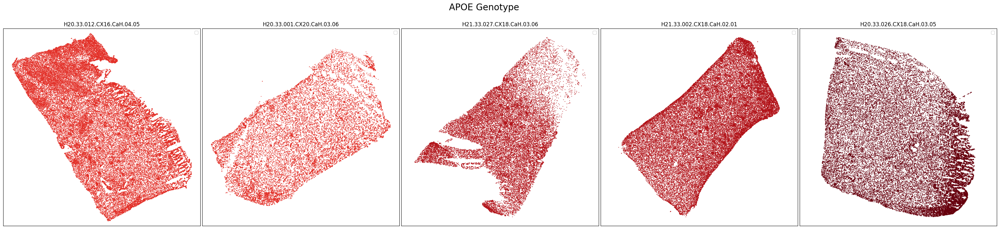

In [16]:
section_list = [
    'H20.33.012.CX16.CaH.04.05', 'H20.33.001.CX20.CaH.03.06',
    'H21.33.027.CX18.CaH.03.06', 'H21.33.002.CX18.CaH.02.01',
    'H20.33.026.CX18.CaH.03.05'
]
for field in value_sets.field.unique():
    if field not in cell_metadata.columns:
        continue
    fig, ax = plot_sections(
        cell_metadata,
        field,
        section_list,
    )
    fig.suptitle(field, size=20)
    plt.show()
    break

## Taxonomy mapping

Now that we have our base functions for plotting set up and we've exercised them using values donor level data, let's load the taxonomy information so that we can plot the spatial locations of various cell types. Below, we load and merge all the information we need to plot cell colors and taxonomy as done in the [previous SEA-AD CaH tutorials](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_clustering_analysis_and_annotation.html).

In [ ]:
cell_to_cluster_membership = abc_cache.get_metadata_dataframe(
    'SEA-AD-CaH-Xenium', 'mmc_results'
).set_index('cell_label')
cluster = abc_cache.get_metadata_dataframe(
    'SEA-AD-CaH-taxonomy', 'cluster'
).set_index('label')
cluster_annotation_term = abc_cache.get_metadata_dataframe(
    'SEA-AD-CaH-taxonomy', 'cluster_annotation_term'
).set_index('label')

cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cluster_annotation_term_set'
).set_index('label')

cluster_to_cluster_annotation_membership = abc_cache.get_metadata_dataframe(
    directory='SEA-AD-CaH-taxonomy',
    file_name='cluster_to_cluster_annotation_membership'
).set_index('cluster_annotation_term_label')

membership_with_cluster_info = cluster_to_cluster_annotation_membership.join(
    cluster.reset_index().set_index('cluster_alias')[['number_of_cells']],
    on='cluster_alias'
)

membership_with_cluster_info = membership_with_cluster_info.join(cluster_annotation_term, rsuffix='_anno_term').reset_index()

membership_groupby = membership_with_cluster_info.groupby(
    ['cluster_alias', 'cluster_annotation_term_set_name']
)

cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_order = membership_groupby['term_order'].first().unstack()

cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[cluster_annotation_term_set['name']]

cell_extended = cell_metadata.join(cell_to_cluster_membership, how='inner')
cell_extended = cell_extended.join(cluster_colors, on='cluster_alias', rsuffix='_color')
cell_extended = cell_extended.join(cluster_order, on='cluster_alias', rsuffix='_order')
cell_extended.head()

mmc_results.csv: 100%|██████████| 108M/108M [00:16<00:00, 6.43MMB/s]   
cluster.csv: 100%|██████████| 1.80k/1.80k [00:00<00:00, 12.5kMB/s]
cluster_annotation_term.csv: 100%|██████████| 12.3k/12.3k [00:00<00:00, 63.6kMB/s]
cluster_annotation_term_set.csv: 100%|██████████| 222/222 [00:00<00:00, 322MB/s]
cluster_to_cluster_annotation_membership.csv: 100%|██████████| 12.4k/12.4k [00:00<00:00, 89.1kMB/s]


In [ ]:
cell_extended.donor_race.unique()

Merging in the taxonomy allows one to select cells by the specific taxons they are associated with, as we will see in a function we create below.

### Plotting the taxonomy

Now that the taxonomy is loaded, we plot the the cells showing the spatial locations of the cell types in the Caudate.

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label

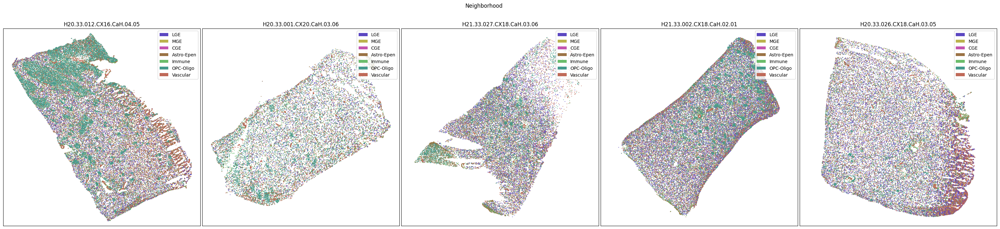

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label

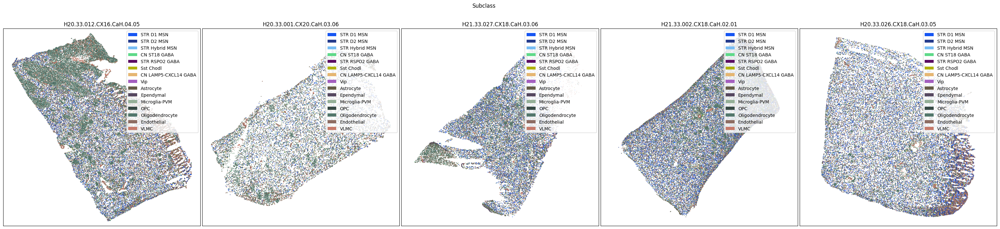

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[idx].legend(loc=0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_19091/699810687.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label

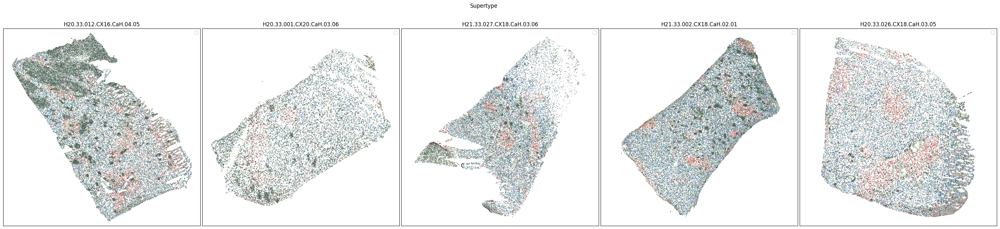

In [18]:
for field in ['Neighborhood', 'Subclass', 'Supertype']:
    fig, ax = plot_sections(
        cell_extended,
        field,
        section_list,
        plot_labels=field in ['Neighborhood', 'Subclass']
    )
    fig.suptitle(f'{field}')
    plt.show()

In the next tutorial, we will explore [gene expression patterns across these spatial transcriptomics datasets](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_spatial_genes.html).

To learn more about the taxonomy used in this notebook and the data it is derived from, see the [SEA-AD CaH Clustering Analysis and Taxonomy notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/sea-ad_cah_clustering_analysis_and_annotation.html).